In [17]:
import time
import jax.random as jr
import powerbox as pbox
from powerbox import get_power
import numpy as np 
import matplotlib.pyplot as plt
import tensorflow_probability.substrates.jax.distributions as tfd

data_dir = "/Users/Jed.Homer/phd/teaching/sbi_ml_lab/gaussian_fields/data/"
figs_dir = "/Users/Jed.Homer/phd/teaching/sbi_ml_lab/gaussian_fields/figs/"

#### powerbox fields

In [18]:
t0 = time.time()

key = jr.PRNGKey(0)

ensure_physical = True

n_pix = 64 
n_sims = 50_000
n_sims_0 = 10_000

AB = np.array([1., 1.]) # Fiducial cosmology
lower = np.array([0.1, .1])
upper = np.array([2., 2.])

# Sample cosmologies
parameter_prior = tfd.Blockwise([
    tfd.Uniform(
        lower[i].astype(np.float32), 
        upper[i].astype(np.float32)
    ) for i in range(2)]
)

parameters = parameter_prior.sample(n_sims, seed=key)

In [19]:
# Generate fields at different cosmologies
G_x = np.zeros((n_sims, n_pix, n_pix)) # Fields
LN_x = np.zeros((n_sims, n_pix, n_pix))
Pk_G = np.zeros((n_sims, 29)) # Power spectra
Pk_LN = np.zeros((n_sims, 29))
for i in range(n_sims):
    Ai, Bi = parameters[i]

    g = pbox.PowerBox(
        N=n_pix,                     
        dim=2,                     
        pk=lambda k: Ai * k ** -Bi, 
        ensure_physical=ensure_physical,
        boxlength=1.,           
        seed=i
    ).delta_x()

    ln = pbox.LogNormalPowerBox(
        N=n_pix,                     
        dim=2,                     
        pk=lambda k: Ai * k ** -Bi, 
        ensure_physical=ensure_physical,
        boxlength=1.,           
        seed=i 
    ).delta_x()

    Pk_g, k = get_power(g, 1., ignore_zero_mode=True)
    Pk_ln, k = get_power(ln, 1., ignore_zero_mode=True)

    G_x[i] = g
    LN_x[i] = ln
    Pk_G[i] = Pk_g
    Pk_LN[i] = Pk_ln

    print(f"\r{i=}", end="")

print(str((time.time() - t0) / 60.) + "mins")

i=88

/Users/Jed.Homer/phd/teaching/sbi_ml_lab/.venv/lib/python3.9/site-packages/powerbox/powerbox.py:386: RuntimeWarning: invalid value encountered in log
  return np.log(1 + self.correlation_array())


i=499991.8351204991340637mins


In [20]:
# Generate fields at fixed true cosmology to measure covariance 
# (not necessary, covariance is analytic)
A, B = AB

t0 = time.time()
G_x_0 = np.zeros((n_sims_0, n_pix, n_pix))
LN_x_0 = np.zeros((n_sims_0, n_pix, n_pix))
Pk_G_0 = np.zeros((n_sims_0, 29))
Pk_LN_0 = np.zeros((n_sims_0, 29))
for i in range(n_sims_0):
    g = pbox.PowerBox(
        N=n_pix,                     
        dim=2,                     
        pk=lambda k: A * k ** -B, 
        ensure_physical=ensure_physical,
        boxlength=1.,           
        seed=i
    ).delta_x()

    ln = pbox.LogNormalPowerBox(
        N=n_pix,                     
        dim=2,                     
        pk=lambda k: A * k ** -B, 
        ensure_physical=ensure_physical,
        boxlength=1.,           
        seed=i 
    ).delta_x()

    Pk_g, k = get_power(g, 1., ignore_zero_mode=True)
    Pk_ln, k = get_power(ln, 1., ignore_zero_mode=True)

    G_x_0[i] = g 
    LN_x_0[i] = ln
    Pk_G_0[i] = Pk_g
    Pk_LN_0[i] = Pk_ln

    print(f"\r{i=}", end="")

str((time.time() - t0) / 60.) + " mins" 

i=9999

'0.3145853360493978 mins'

In [21]:
covariance_G = np.cov(G_x_0.reshape(len(G_x_0), -1), rowvar=False)
covariance_LN = np.cov(LN_x_0.reshape(len(LN_x_0), -1), rowvar=False)

covariance_Pk_G = np.cov(Pk_G_0.reshape(len(Pk_G_0), -1), rowvar=False)
covariance_Pk_LN = np.cov(Pk_LN_0.reshape(len(Pk_LN_0), -1), rowvar=False)

In [22]:
print(parameters.shape)
# np.exp(dk - np.var(dk) / 2) - 1

np.save(data_dir + "gaussian_fields.npy", G_x)
np.save(data_dir + "lognormal_fields.npy", LN_x)
np.save(data_dir + "gaussian_fields_fiducial.npy", G_x_0)
np.save(data_dir + "lognormal_fields_fiducial.npy", LN_x_0)

np.save(data_dir + "gaussian_fields_Pk.npy", Pk_G)
np.save(data_dir + "lognormal_fields_Pk.npy", Pk_LN)
np.save(data_dir + "gaussian_fields_Pk_fiducial.npy", Pk_G_0)
np.save(data_dir + "lognormal_fields_Pk_fiducial.npy", Pk_LN_0)
np.save(data_dir + "k_values.npy", k)

np.save(data_dir + "gaussian_fields_covariance.npy", covariance_G)
np.save(data_dir + "lognormal_fields_covariance.npy", covariance_LN)

np.save(data_dir + "gaussian_fields_Pk_covariance.npy", covariance_Pk_G)
np.save(data_dir + "lognormal_fields_Pk_covariance.npy", covariance_Pk_LN)

np.save(data_dir + "gaussian_fields_parameters.npy", parameters)
np.save(data_dir + "lognormal_fields_parameters.npy", parameters)

(50000, 2)


In [23]:
pb = pbox.PowerBox(
    N=1024,                     
    dim=2,                     
    pk=lambda k: 0.1 * k ** -2., 
    ensure_physical=ensure_physical,
    boxlength=1.0,           
    seed=1010                
)

lnpb = pbox.LogNormalPowerBox(
    N=1024,                     
    dim=2,                     
    pk=lambda k: 0.1 * k ** -2., 
    ensure_physical=ensure_physical,
    boxlength=1.0,           
    seed=1010                
)

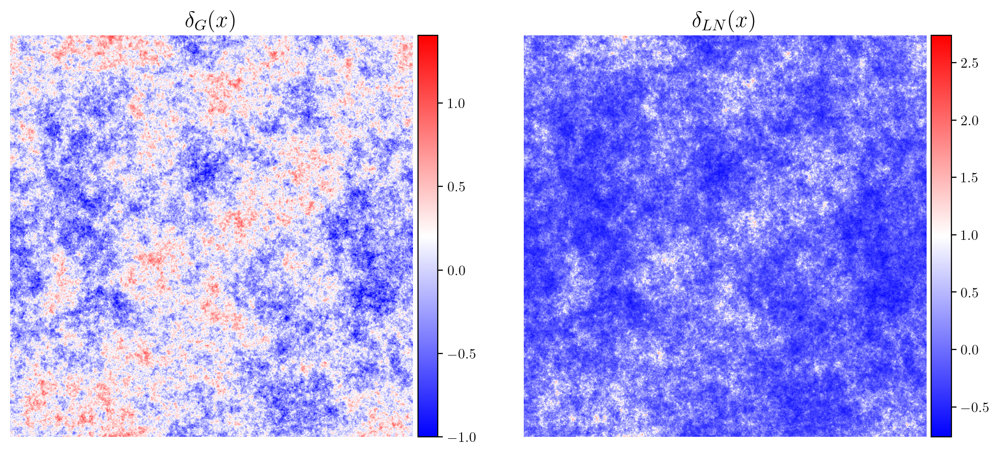

In [24]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
rc('text', usetex=True)

cmap = "bwr"

fig, axs = plt.subplots(1, 2, dpi=200, figsize=(12., 6.))

ax = axs[1]
ax.set_title("$\delta_{LN}(x)$", fontsize=16)
im = ax.imshow(lnpb.delta_x(), cmap=cmap)

divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cbar = fig.colorbar(im, cax=cax, orientation='vertical');
# cbar.set_label(label="$\delta_{LN}(x)$", rotation=0, fontsize=16)
ax.axis("off")

ax = axs[0]
ax.set_title("$\delta_{G}(x)$", fontsize=16)
im = ax.imshow(pb.delta_x(), cmap=cmap)

divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cbar = fig.colorbar(im, cax=cax, orientation='vertical');
# cbar.set_label(label="$\delta_G(x)$", rotation=0, fontsize=16)
ax.axis("off")

# plt.tight_layout()
plt.savefig(figs_dir + "ln_and_g_fields.pdf", bbox_inches="tight")
plt.show()

add measurement noise => hierarchical model

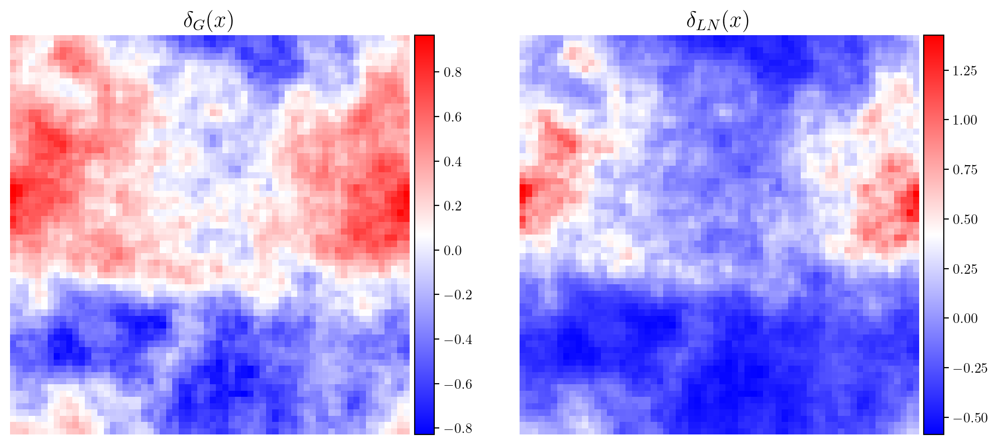

In [25]:
import jax.random as jr 
import jax.numpy as jnp

pb = pbox.PowerBox(
    N=n_pix,                     
    dim=2,                     
    pk=lambda k: 2. * k ** -3., 
    boxlength=1.,
    ensure_physical=ensure_physical,
    seed=1010                
)

lnpb = pbox.LogNormalPowerBox(
    N=n_pix,                     
    dim=2,                     
    pk=lambda k: 2. * k ** -3., 
    boxlength=1.,           
    ensure_physical=ensure_physical,
    seed=1010                
)

# cov = jnp.eye(n_pix ** 2) * 0.05
noise = 0.

# noise = jr.multivariate_normal(key, mean=jnp.zeros(n_pix ** 2), cov=cov)

fig, axs = plt.subplots(1, 2, dpi=200, figsize=(12., 6.))

ax = axs[1]

ax.set_title("$\delta_{LN}(x)$", fontsize=16)
im = ax.imshow(lnpb.delta_x() + noise, cmap="bwr")

divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cbar = fig.colorbar(im, cax=cax, orientation='vertical')
ax.axis("off")

ax = axs[0]
ax.set_title("$\delta_{G}(x)$", fontsize=16)
im = ax.imshow(pb.delta_x() + noise, cmap="bwr")

divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cbar = fig.colorbar(im, cax=cax, orientation='vertical')
ax.axis("off")

plt.show()

measure $P(k)$ for each realisation

In [26]:
from powerbox import get_power

n_sims = 1_000

g = np.zeros((n_sims, 29))
ln = np.zeros((n_sims, 29))
g_x = np.zeros((n_sims, n_pix, n_pix))
ln_x = np.zeros((n_sims, n_pix, n_pix))

for i in range(n_sims):
    g_i = pbox.PowerBox(
        N=n_pix,                     
        dim=2,                     
        pk=lambda k: 2. * k ** -3., 
        ensure_physical=ensure_physical,
        boxlength=1.,           
        seed=i
    )

    ln_i = pbox.LogNormalPowerBox(
        N=n_pix,                     
        dim=2,                     
        pk=lambda k: 2. * k ** -3., 
        ensure_physical=ensure_physical,
        boxlength=1.,           
        seed=i 
    )

    p_k_field, bins_field = get_power(g_i.delta_x(), pb.boxlength)
    p_k_lnfield, bins_lnfield = get_power(ln_i.delta_x(), lnpb.boxlength)

    g_x[i] = g_i.delta_x()
    ln_x[i] = ln_i.delta_x()
    g[i] = p_k_field
    ln[i] = p_k_lnfield

    print(f"\r {i=}", end="")

 i=999

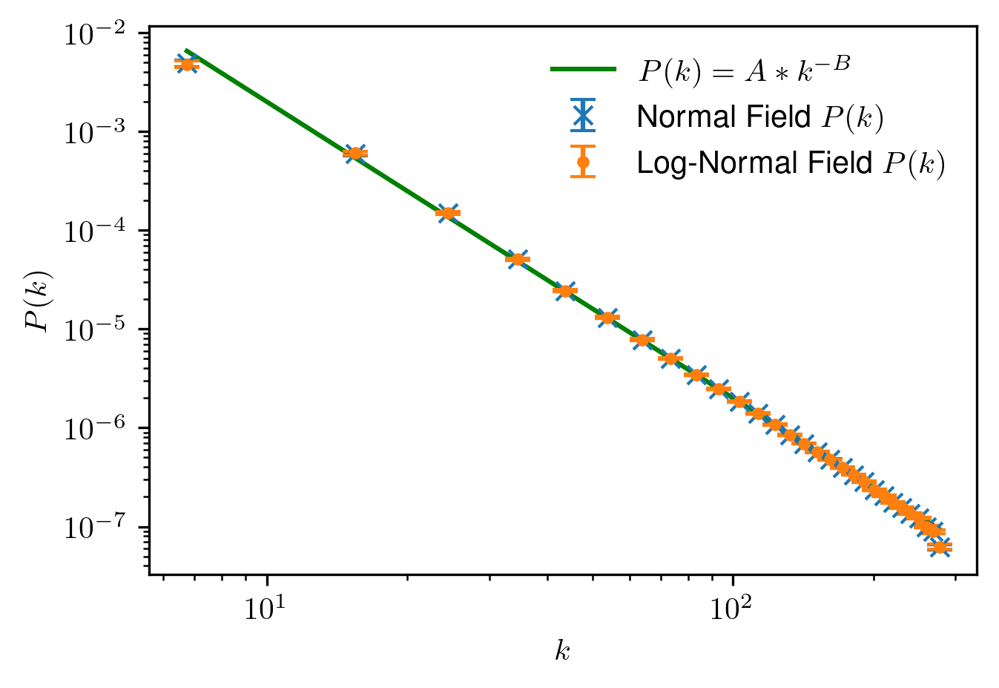

In [27]:
# Only two arguments required when passing a field

plt.figure(dpi=300, figsize=(4.8, 3.2))

plt.plot(bins_field, 2. * bins_field ** -3., label="$P(k)=A * k^{-B}$", color="green")
plt.errorbar(
    bins_field, 
    g.mean(axis=0), 
    yerr=g.std(axis=0) / np.sqrt(100), 
    label="Normal Field $P(k)$", 
    marker="x", 
    linestyle="", 
    capsize=4
)
plt.errorbar(
    bins_lnfield, 
    ln.mean(axis=0), 
    yerr=ln.std(axis=0) / np.sqrt(100), 
    label="Log-Normal Field $P(k)$", 
    marker=".", 
    linestyle="", 
    capsize=4
)

plt.legend(frameon=False)
plt.xscale('log'); plt.xlabel("$k$",)# fontsize=20)
plt.yscale('log'); plt.ylabel("$P(k)$")#, fontsize=20)
plt.savefig(figs_dir + "Pk.pdf", bbox_inches="tight")
plt.show()

i=999

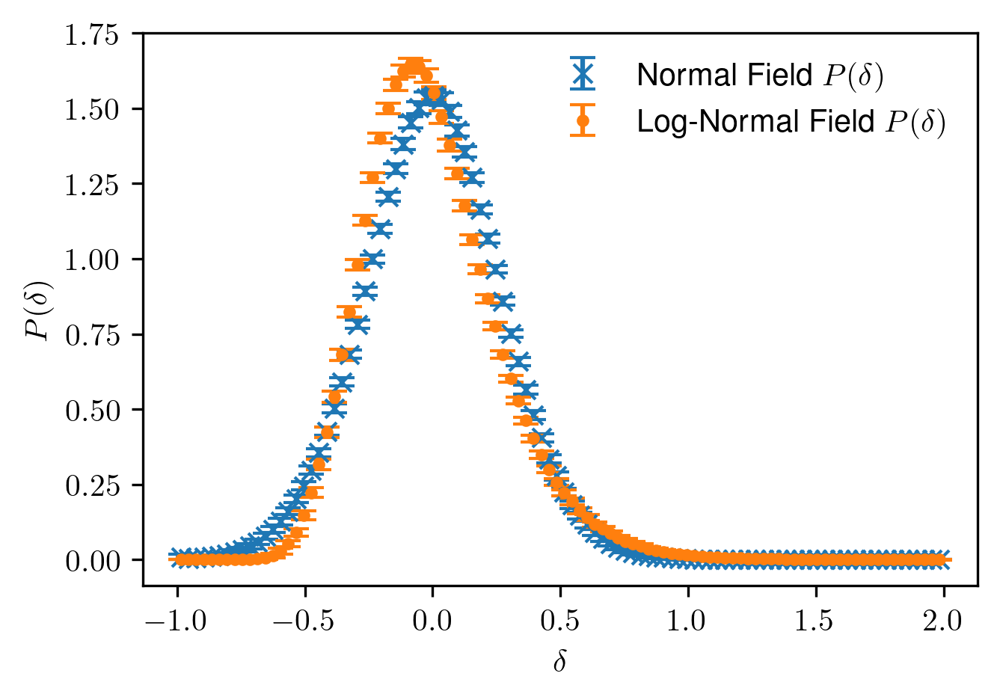

In [28]:
plt.figure(dpi=300, figsize=(4.8, 3.2))

y_g = np.zeros((len(g_x), 100))
for i, g in enumerate(g_x):
    y, bin_edges = np.histogram(
        g.flatten(), 
        bins=100, 
        range=[-1., 2.], 
        density=True
        # range=[min(ln_x.min(), g_x.min()), max(ln_x.max(), g_x.max())]
    )
    y_g[i] = y

    print(f"\r{i=}", end="")

bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

plt.errorbar(
    bin_centers,
    y_g.mean(axis=0),
    yerr=y_g.std(axis=0) ** 0.5 / np.sqrt(n_sims),
    marker='x',
    linestyle="",
    drawstyle='steps-mid',
    capsize=4,
    label="Normal Field $P(\delta)$"
)
plt.ylabel("$P(\delta)$")
plt.xlabel("$\delta$")

y_ln = np.zeros((len(ln_x), 100))
for i, ln in enumerate(ln_x):
    y, bin_edges = np.histogram(
        ln.flatten(), 
        bins=100, 
        range=[-1., 2.],density=True
        # range=[min(ln_x.min(), g_x.min()), max(ln_x.max(), g_x.max())])
    )
    y_ln[i] = y
    print(f"\r{i=}", end="")

bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

plt.errorbar(
    bin_centers,
    y_ln.mean(axis=0),
    yerr=y_ln.std(axis=0) ** 0.5 / np.sqrt(n_sims),
    marker='.',
    linestyle="",
    drawstyle='steps-mid',
    capsize=4,
    label="Log-Normal Field $P(\delta)$"
)
plt.legend(frameon=False)
# plt.yscale("log")
# plt.xscale("log")
plt.savefig(figs_dir + "1pt.pdf", bbox_inches="tight")
plt.show()

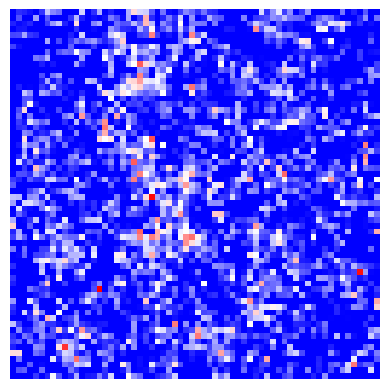

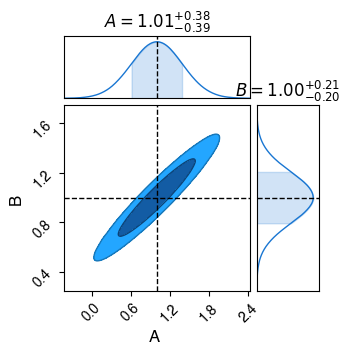

In [29]:
import numpy as np 
import powerbox as pbox
import matplotlib.pyplot as plt
from chainconsumer import ChainConsumer

A, B = AB

g = pbox.PowerBox(
    N=64,                     
    dim=2,                     
    pk=lambda k: A * k ** -B, 
    ensure_physical=ensure_physical,
    boxlength=1.,           
    seed=0
)

plt.figure()
plt.imshow(g.delta_x(), cmap="bwr")
plt.axis("off")
plt.show()

def get_F(AB, field):
    """
        Calculate the Fisher information of the field
        given the parameter values A, B = AB.
    """
    A, B = AB
    
    # Power spectrum and k-modes
    Pk, k = get_power(
        field.delta_x(), field.boxlength, ignore_zero_mode=True
    )
    
    # Inverse covariance (covariance is diagonal)
    Cinv = np.diag(1. / Pk) 

    # Covariance derivatives
    C_A = np.diag(k ** -B)
    C_B = np.diag(-Pk * np.log(k))

    # Fisher matrix elements for each parameter
    F_AA = 0.5 * np.trace((C_A @ Cinv @ C_A @ Cinv))
    F_AB = 0.5 * np.trace((C_A @ Cinv @ C_B @ Cinv))
    F_BA = 0.5 * np.trace((C_B @ Cinv @ C_A @ Cinv))
    F_BB = 0.5 * np.trace((C_B @ Cinv @ C_B @ Cinv))

    return np.array([[F_AA, F_AB], [F_BA, F_BB]])

F = get_F(AB, g)
Finv = np.linalg.inv(F)

c = ChainConsumer()
c.add_covariance(AB, Finv, parameters=["A", "B"])
c.plotter.plot(truth=np.asarray(AB))
plt.show()

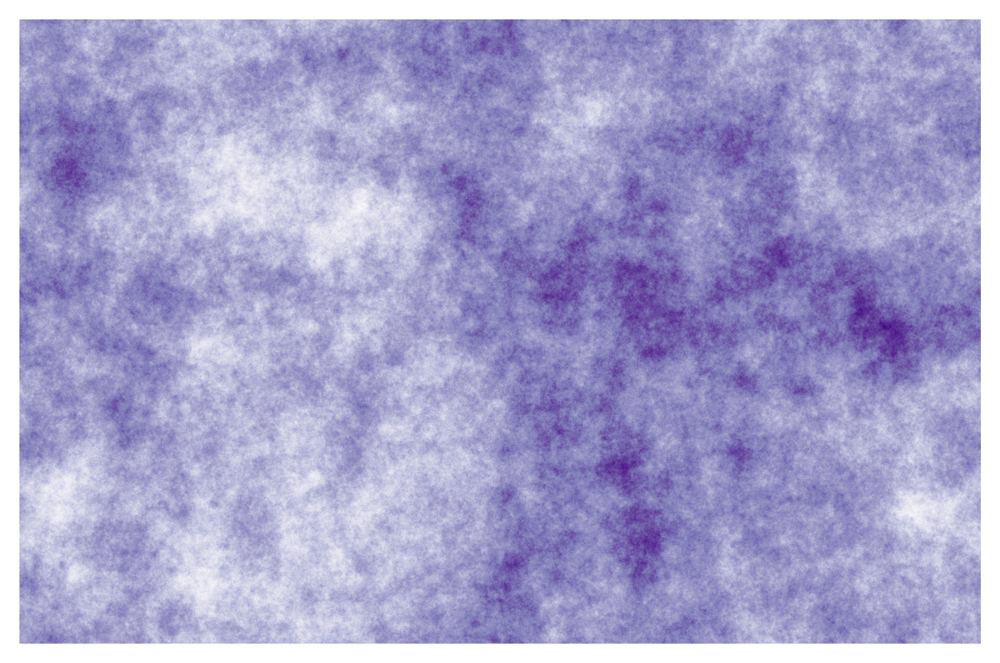

In [30]:
import numpy as np 
import matplotlib.pyplot as plt 

mu = np.random.standard_normal((3024, 1964)).T
muk = np.fft.rfftn(mu)

kgrid = np.c_[
    np.meshgrid(
        *[np.fft.fftfreq(_) for _ in mu.shape[:-1]], 
        np.fft.rfftfreq(mu.shape[-1]), 
        indexing='ij'
    )
]
k = np.linalg.norm(kgrid, axis=0)
Pk = np.zeros_like(k)
Pk[k > 0] = 0.1 * k[k>0] ** -2.5

deltak = muk * np.sqrt(Pk)
delta = np.fft.irfftn(deltak)

# deltak = np.exp(deltak - 0.5 * np.var(deltak)) - 1.
# delta = np.fft.irfftn(deltak)
# delta = jnp.exp(delta)

plt.figure(dpi=800)
plt.imshow(delta, cmap="Purples_r")
plt.axis("off")
plt.show()

In [31]:
if 0:
    g = pbox.PowerBox(
        N=n_pix,                     
        dim=2,                     
        # pk=lambda k: A + B * k, 
        pk=Pk_fn, 
        ensure_physical=ensure_physical,
        boxlength=1.,           
        seed=i
    )

    plt.imshow(g.delta_x())
    plt.show()
    # print(g.power_array().shape, bins_field.shape)

    p_k_field, bins_field = get_power(g.delta_x(), g.boxlength)
    print(p_k_field.shape)

    def get_F(AB, k, N):
        A, B = AB
        _Pk = p_k_field
        # k = k[1:N // 2, 1:N // 2].flatten()
        # _Pk = A * k ** -B #Pk_fn(k, A, B)
        print(_Pk.shape)
        
        Cinv = jnp.diag(1. / _Pk)
        C_A = jnp.diag(k ** -B)
        C_B = jnp.diag(-_Pk * np.log(k))

        F_AA = 0.5 * jnp.trace((C_A @ Cinv @ C_A @ Cinv))
        F_AB = 0.5 * jnp.trace((C_A @ Cinv @ C_B @ Cinv))
        F_BA = 0.5 * jnp.trace((C_B @ Cinv @ C_A @ Cinv))
        F_BB = 0.5 * jnp.trace((C_B @ Cinv @ C_B @ Cinv))

        return jnp.array([[F_AA, F_AB], [F_BA, F_BB]])

    alpha = jnp.array([0.5, 4.])
    # F = fisher(alpha, bins_field, 128)
    F = fisher(alpha, bins_field, n_pix)
    Finv = jnp.linalg.inv(F)

    from chainconsumer import ChainConsumer

    c = ChainConsumer()
    c.add_covariance(alpha, Finv)
    c.plotter.plot()
    plt.show()

    def get_F(AB, field):

        A, B = AB
        
        Cinv = jnp.diag(1. / Pk)
        C_A = jnp.diag(k ** -B)
        C_B = jnp.diag(-Pk * np.log(k))

        F_AA = 0.5 * jnp.trace((C_A @ Cinv @ C_A @ Cinv))
        F_AB = 0.5 * jnp.trace((C_A @ Cinv @ C_B @ Cinv))
        F_BA = 0.5 * jnp.trace((C_B @ Cinv @ C_A @ Cinv))
        F_BB = 0.5 * jnp.trace((C_B @ Cinv @ C_B @ Cinv))

        return jnp.array([[F_AA, F_AB], [F_BA, F_BB]])

In [32]:
if 0:
    import jax
    import jax.numpy as jnp 
    import jax.random as jr 

    key = jr.PRNGKey(0)

    def Pk_fn(k, parameters):
        A, B = parameters
        Pk = jnp.zeros_like(k)
        Pk[k > 0] = A * k[k > 0] ** -B
        return Pk

    def simulator(key, parameters, n_pix=1024):
        mu = jr.normal(key, shape=(n_pix, n_pix))
        muk = jnp.fft.rfftn(mu)

        kgrid = jnp.c_[
            jnp.meshgrid(
                *[jnp.fft.fftfreq(_) for _ in mu.shape[:-1]], 
                jnp.fft.rfftfreq(mu.shape[-1]), 
                indexing='ij'
            )
        ]
        k = jnp.linalg.norm(kgrid, axis=0)
        Pk = Pk_fn(k, A, B)

        deltak = muk * jnp.sqrt(Pk)
        delta = jnp.fft.irfftn(deltak)
        return delta

    delta = simulator(key)

    plt.imshow(delta, cmap="PuOr")
    plt.show()